## **Ćwiczenie 5. Platforma testowa** 
**Napisz skrypt w Pythonie/Matlabie umożliwiający wczytywanie i wizualizację badanych obrazów.**

Program powinien umożliwiać wyświetlanie obrazu wczytanego z pliku o podanej nazwie, wybór podobrazu 
(prostokątnego obszaru) o podanych współrzędnych oraz jego zapis do zadanego pliku.

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

Normalne wyświetlanie obrazu.

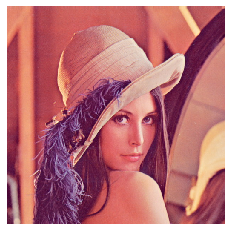

In [2]:
lena = cv2.imread('./projekt2_zdj/lena.jpg')
lena1 = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB)

plt.imshow(lena1), plt.axis("off")
plt.show()

## **Ćwiczenie 6. Przekształcenia punktowe**

Przekształcenie punktowe T obrazu ma ogólną postać s = T(r), gdzie r, s oznaczają odpowiednio poziom szarości piksela obrazu wejściowego i wyjściowego.


**Zaobserwuj działanie następujących przekształceń punktowych na przykładowych obrazach:**

a) Mnożenie obrazu przez stałą T(r) = c · r, gdzie c jest stałą.

b) Zmianę dynamiki skali szarości (kontrastu). Możesz zastosować transformację o postaci
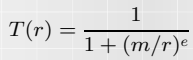
gdzie m i e są ustalonymi parametrami przekształcenia (np. m = 0,45, e = 8).
Wykreśl T(r), by lepiej uwidocznić wpływ T na kontrast obrazu wyjściowego.
Przeprowadź eksperymenty z różnymi wartościami parametrów m i e.

c) Korekcję gamma, zdefiniowaną jako s = c · r^γ, gdzie c > 0 i γ > 0 są stałymi we wzorze przekształcenia.

1. Mnożenie obrazu przez stałą:

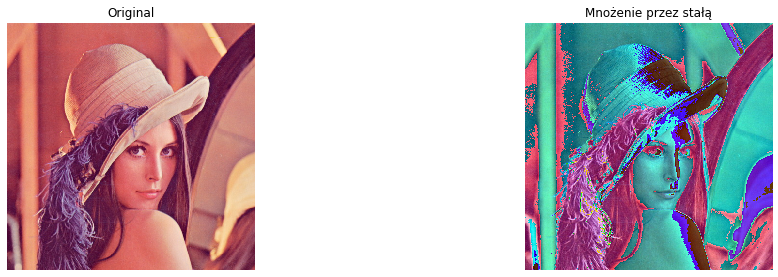

In [3]:
lena2 = lena1*1.5
lena2 = lena2.astype('uint8')

plt.figure(figsize=(17,10))
plt.subplot(221), plt.imshow(lena1), plt.title('Original'), plt.axis("off")
plt.subplot(222), plt.imshow(lena2), plt.title('Mnożenie przez stałą'), plt.axis("off")
plt.show()

2. Potęgowanie kontrastu obrazu kolorowego:

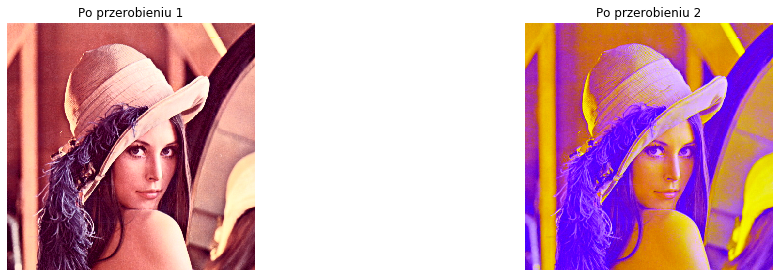

In [4]:
lena_yuv = cv2.cvtColor(lena, cv2.COLOR_BGR2YUV)
lena_yuv[:, :, 0] = cv2.equalizeHist(lena_yuv[:, :, 0])
lena_rgb = cv2.cvtColor(lena_yuv, cv2.COLOR_YUV2RGB)

lena_yuv1 = cv2.cvtColor(lena, cv2.COLOR_BGR2YUV)
lena_yuv1[:, :, 1] = cv2.equalizeHist(lena_yuv1[:, :, 1])
lena_rgb1 = cv2.cvtColor(lena_yuv1, cv2.COLOR_YUV2RGB)

plt.figure(figsize=(17,10))
plt.subplot(221), plt.imshow(lena_rgb), plt.title('Po przerobieniu 1'), plt.axis("off")
plt.subplot(222), plt.imshow(lena_rgb1), plt.title('Po przerobieniu 2'), plt.axis("off")
plt.show()

3. Korekcja gamma:

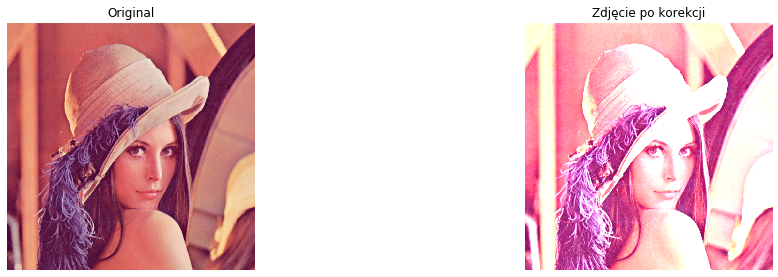

In [5]:
image = lena1
new_image = np.zeros(image.shape, image.dtype)
alpha = 2.0 # Simple contrast control [1.0-3.0]
beta = 0    # Simple brightness control [0-100]

for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            new_image[y,x,c] = np.clip(alpha*image[y,x,c] + beta, 0, 255)
            
plt.figure(figsize=(17,10))
plt.subplot(221), plt.imshow(image), plt.title('Original'), plt.axis("off")
plt.subplot(222), plt.imshow(new_image), plt.title('Zdjęcie po korekcji'), plt.axis("off")
plt.show()

## **Ćwiczenie 7. Histogram obrazu**  
**Wypróbuj działanie wyrównywania histogramu na przykładowych obrazach.**

By zaobserwować skuteczność procedury, poddaj wyrównywaniu obrazy
zbyt ciemne i zbyt jasne. Narysować histogramy obrazów przed i po wyrównaniu.

**Histogram obrazu cyfrowego to wykres obrazujący, ile pikseli o każdej intensywności jest w obrazie.**

● W osi OX odłożone są wszystkie możliwe intensywności w obrazie.

● Pozycja Y punktu (wysokość słupka) jest proporcjonalna do liczby pikseli obrazu o intensywności X.

1. Wyrówanie histogramu dla normalnego obrazu:

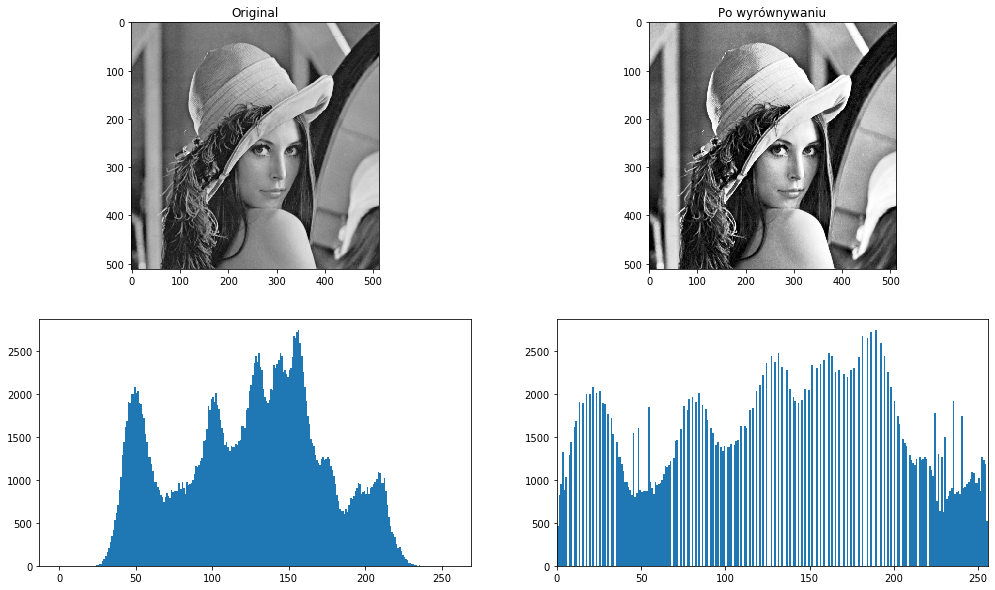

In [6]:
lena = cv2.imread('./projekt2_zdj/lena.jpg', 0)
equalized_lena = cv2.equalizeHist(lena)

plt.figure(figsize=(17,10))
plt.subplot(221), plt.imshow(lena, 'gray'), plt.title('Original')
plt.subplot(222), plt.imshow(equalized_lena, 'gray'), plt.title('Po wyrównywaniu')
plt.subplot(223), plt.hist(lena.ravel(), 256, [0, 256])
plt.subplot(224), plt.hist(equalized_lena.ravel(), 256, [0, 256])
plt.xlim([0,256])

plt.show()

2. Wyrówanie histogramu dla ciemnego obrazu:

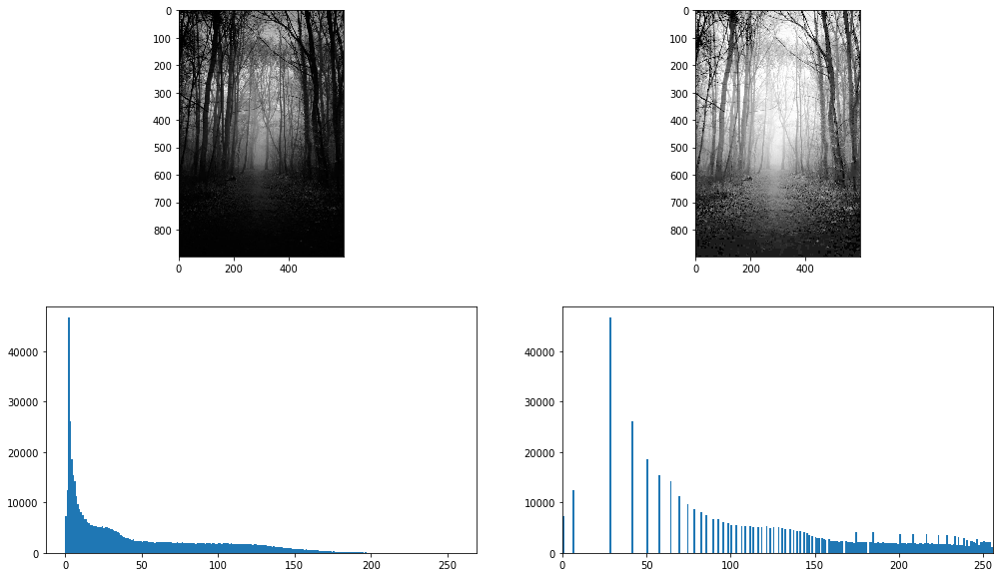

In [7]:
dark = cv2.imread('./projekt2_zdj/dark.jpg', 0)
equalized_dark = cv2.equalizeHist(dark)

plt.figure(figsize=(17,10))
plt.subplot(221), plt.imshow(dark, 'gray')
plt.subplot(222), plt.imshow(equalized_dark, 'gray')
plt.subplot(223), plt.hist(dark.ravel(), 256, [0, 256])
plt.subplot(224), plt.hist(equalized_dark.ravel(), 256, [0, 256])
plt.xlim([0,256])

plt.show()

3. Wyrówanie histogramu dla jasnego obrazu:

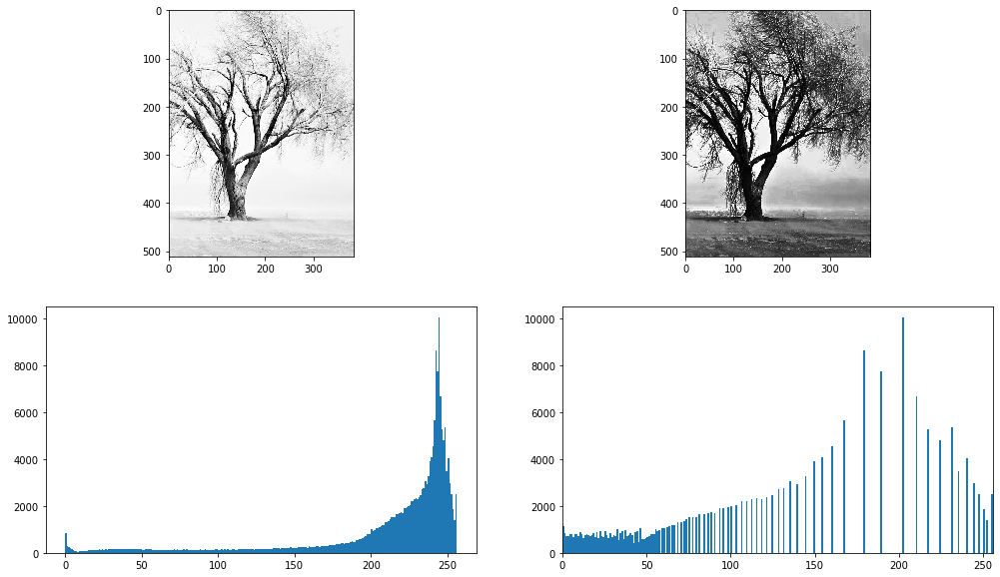

In [8]:
white = cv2.imread('./projekt2_zdj/white.jpg', 0)
equalized_white = cv2.equalizeHist(white)

plt.figure(figsize=(17,10))
plt.subplot(221), plt.imshow(white, 'gray')
plt.subplot(222), plt.imshow(equalized_white, 'gray')
plt.subplot(223), plt.hist(white.ravel(), 256, [0, 256])
plt.subplot(224), plt.hist(equalized_white.ravel(), 256, [0, 256])
plt.xlim([0,256])

plt.show()

## **Ćwiczenie 9. Filtracja górnoprzepustowa** 

**Zastosuj filtry górnoprzepustowe do wykrywania krawędzi na przykładowych obrazach.**
1. Użyj filtra z maską Sobela do wykrywania krawędzi.
1. Zaobserwuj działanie Laplasjanu do wyostrzania szczegółów.


### 1. Filtr Sobela. 

Filtr Sobela jest operatorem stosowanym w technice przetwarzania obrazów do wykrywania krawędzi. Biblioteka *opencv* udostępnia funkcje Sobel, która umożliwia przemnożenie obrazu przez maskę dla 4 kątów. Kąt reguluje się parametrami *dx*, *dy* przy wywołaniu funkcji (ustawia się wartość 0 lub 1).

In [9]:
img0 = cv2.imread('./projekt2_zdj/image.jpg')
# konwertujemy szarość
gray = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY)
# usuwamy szum
img = cv2.GaussianBlur(gray, (3, 3), 0)

Zaobserwujemy wpływ zmiany parametru *ksize* na wykrywanie krawędzi przez filtr Sobela

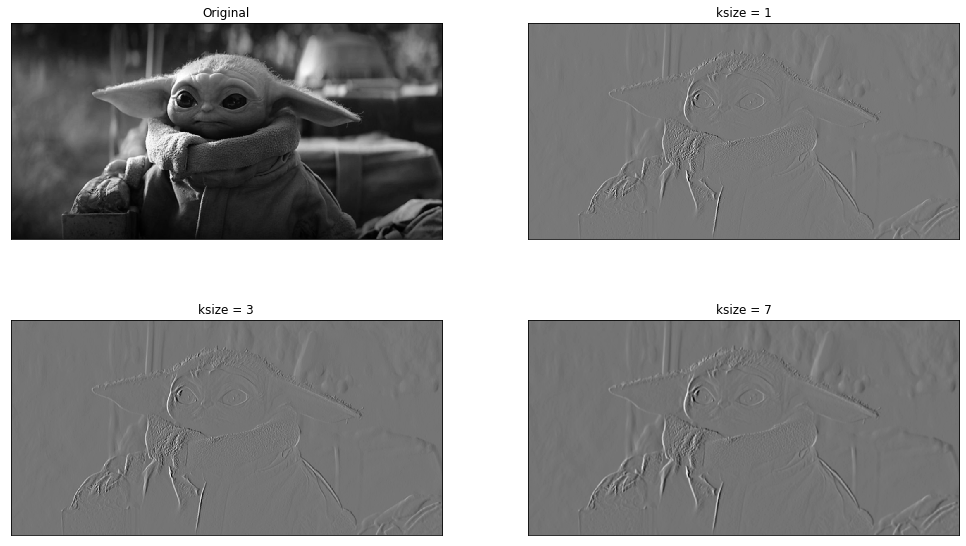

In [10]:
sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=1)  # x
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # x
sobely = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=7)  # y

plt.figure(figsize=(17,10))
plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 2), plt.imshow(sobel, cmap='gray')
plt.title('ksize = 1'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 3), plt.imshow(sobelx, cmap='gray')
plt.title('ksize = 3'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 4), plt.imshow(sobely, cmap='gray')
plt.title('ksize = 7'), plt.xticks([]), plt.yticks([])

plt.show()

Jak możemy zauważyć im większy parametr tym lepiej i głębiej zarywsowane krawędzie. Parametr ten jest skolerowany z wielkością maski używanej do filtracji obrazu.

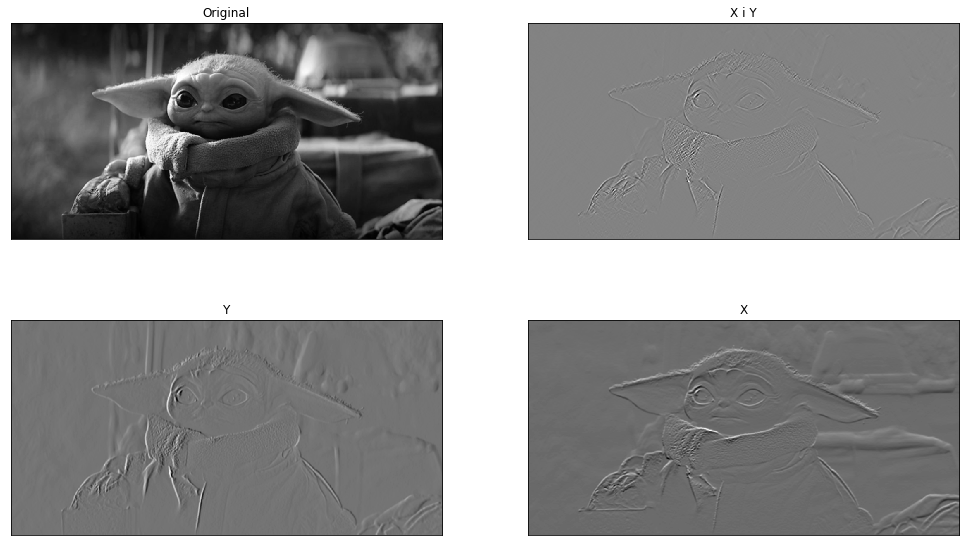

In [11]:
sobelxy = cv2.Sobel(img, cv2.CV_64F, 1, 1, ksize=7)  # x
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=7)  # x
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=7)  # y
plt.figure(figsize=(17,10))
plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 2), plt.imshow(sobelxy, cmap='gray')
plt.title('X i Y'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 3), plt.imshow(sobelx, cmap='gray')
plt.title('Y'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 4), plt.imshow(sobely, cmap='gray')
plt.title('X'), plt.xticks([]), plt.yticks([])

plt.show()

Zmiana kątu maski powoduje najwidoczniejsze zmiany detekcji krawędzi. W przypadku oznaczonym jako *X i Y* ustawiliśmy kąt na 135 stopni. W *X* na 0 stopni, a w *Y* na 90 stopni. Łatwo zauważyć, że  kąt 0 stopni wykrywa krawędzie poziome, z kolei kąt 90 stopni pionowe. Kąt 135 stopni wydaję się być wypadkową dwóch poprzednich przypadków i znajdować krawędzie punktowe.

### 2. Filtr Laplasjana



Bibliotek *opencv* posiada dedykowaną funkcję *Lapacian*, która poddaje wybrany obraz filtracji Lapsjan. Laplasjan występuje jako macierz o rozmiarze 3x3, gdzie suma jej składników jest równa zero. W swoich badaniach skupiliśmy się na manipulacji składnikami takimi jak *ddepth* oraz *ksize*. Dla *ddepth* zastosowaliśmy następujące wartości:

* cv2.CV_16S
* cv2.CV_32F
* cv2.CV_64F

Nie zauważyliśmy żadnych różnic w manipulacji tym parametrem. O wiele większy wpływ na ostrość obrazu ma parametr *ksize*. 

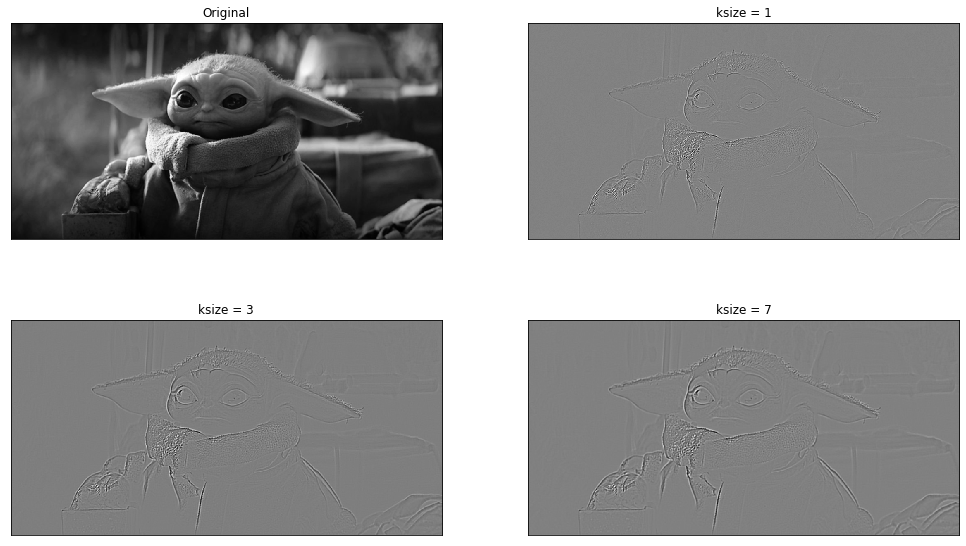

In [12]:
sobel = cv2.Laplacian(img, cv2.CV_16S, 1, 1)
sobelx = cv2.Laplacian(img, cv2.CV_32F, 1, 5)  # x
sobely = cv2.Laplacian(img, cv2.CV_64F, 1, 7)  # y

plt.figure(figsize=(17,10))
plt.subplot(2, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 2), plt.imshow(sobel, cmap='gray')
plt.title('ksize = 1'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 3), plt.imshow(sobelx, cmap='gray')
plt.title('ksize = 3'), plt.xticks([]), plt.yticks([])
plt.subplot(2, 2, 4), plt.imshow(sobely, cmap='gray')
plt.title('ksize = 7'), plt.xticks([]), plt.yticks([])

plt.show()

<div style="text-align: justify">Można z łatwością zauważyć, że parametr ten wpływa bardzo mocno na ostrość obrazu. Szczegóły z tyłu obrazu stają się o bardziej wyraźnie z każdym zwiększeniem wartości tego parametru. Już na tak prostym i krótkim przykładzie można zauważyć, że Laplasjan jest świetnym narzędziem do wyostrzenia obrazów. Wniosek ten został zauważyony i dzisiaj Laplasjan stosuje się w wielu programach graficznych właśnie w tym celu. </div>

# Ćwiczenie 8. Filtracja dolnoprzepustowa

**Zbadaj skuteczność redukcji szumu typu „sól i pieprz” za pomocą:**
1. liniowego filtra uśredniającego z kwadratową maską, rozpoczynając od maski
rozmiaru 3 × 3,
1.  nieliniowego filtra medianowego.

### Rodzaje szumów

#### Sól i pieprz

Sól i pierz to rodzaj szumu, który przejawia się białymi oraz czarnymi pikselami na obrazie. Dotyka on niewielką liczbę pikseli, jednakże ze wzgledu na duże odchylenie pod względem koloru względem swoich sąsiadów niesie on spory wpływ na obraz. 

### 1. Filtr liniowy 

In [13]:
image = cv2.imread('./projekt2_zdj/image.jpg') #czytamy obraz
# dodajemy szum  
row,col,ch = image.shape
s_vs_p = 0.5
amount = 0.1
out = np.copy(image)
# dodajemy sól
num_salt = np.ceil(amount * image.size * s_vs_p)
coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
out[tuple(coords)] = 1
# dodajemy pieprz
num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
out[tuple(coords)] = 0
image = cv2.cvtColor(out, cv2.COLOR_BGR2HSV) 

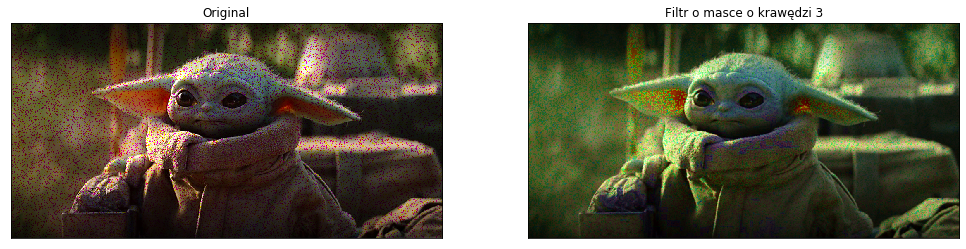

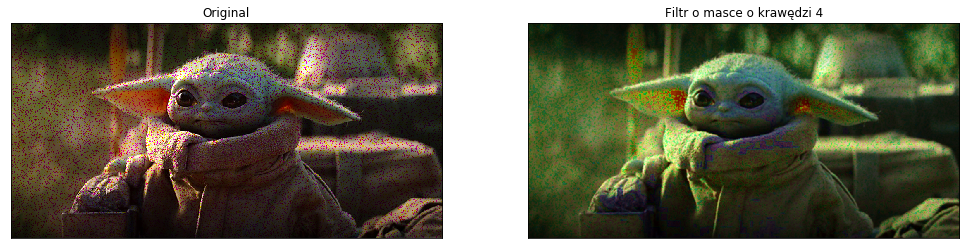

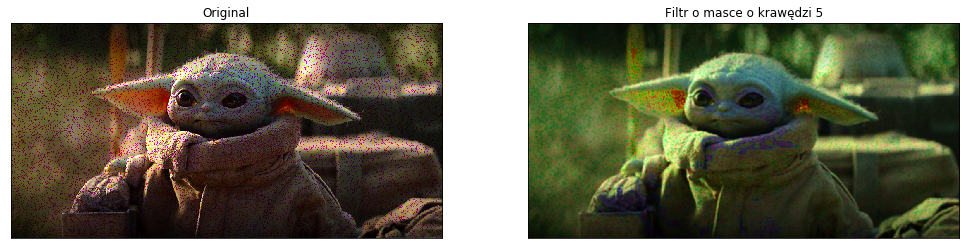

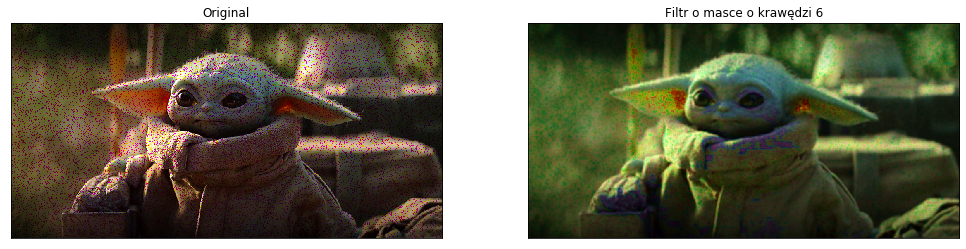

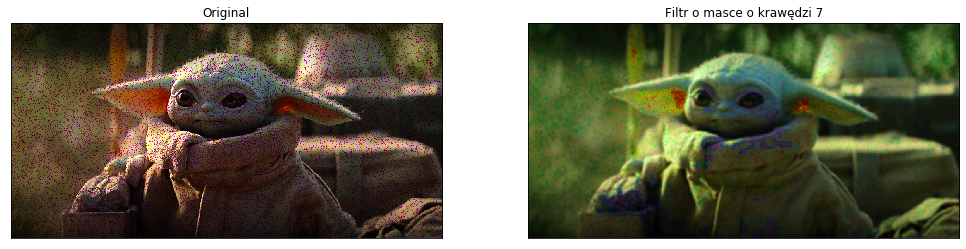

...

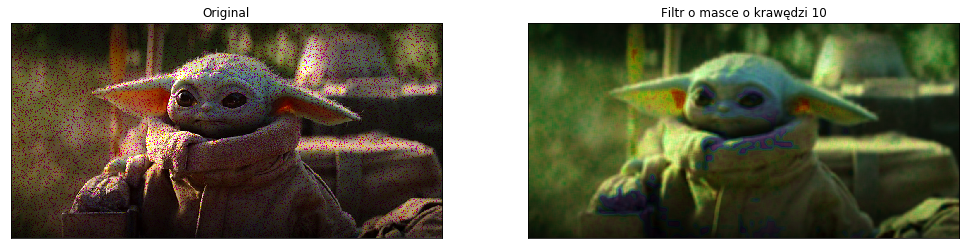

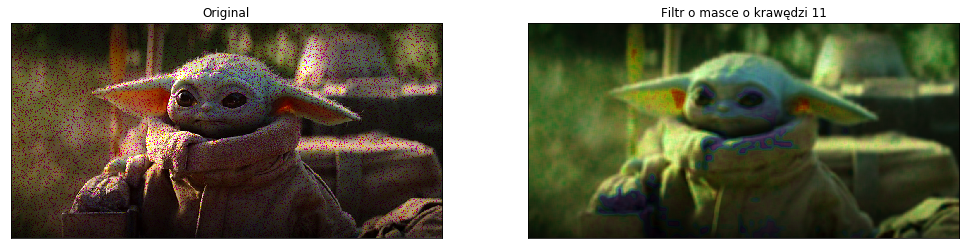

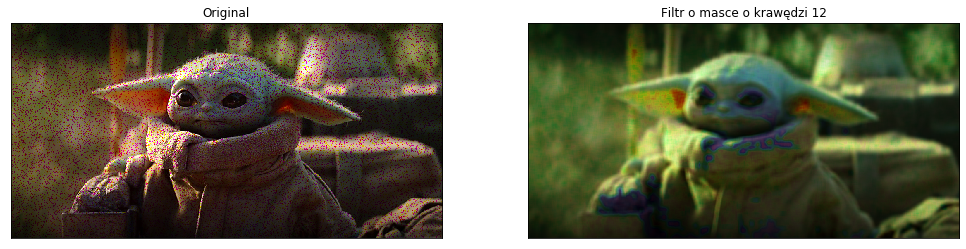

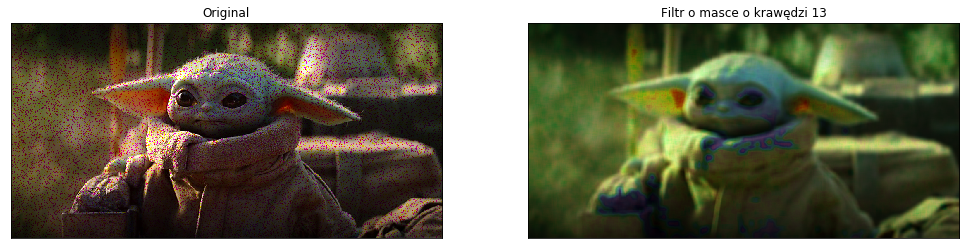

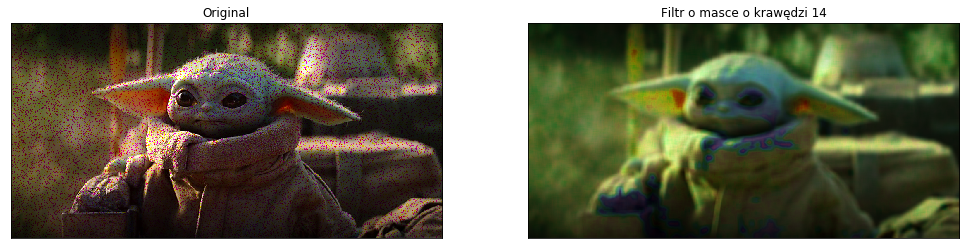

In [14]:
for i in range(3, 15):
    new_image = cv2.blur(image,(i, i))
    plt.figure(figsize=(17,10))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_HSV2RGB)),plt.title('Original')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_HSV2RGB)),plt.title(f"Filtr o masce o krawędzi {i}")
    plt.xticks([]), plt.yticks([])
    plt.show()

Pierwszym filtrem, który zastosowaliśmy jest tzw. "mean filter". Jego działanie jest zbliżone do kompresji obrazów, mianowicie filtr nakłada maskę o wielkości *n x n* pikseli, wyciąga z nich średnią i zamienia wartość wszystkich pikseli objętych maską na wartość uśrednioną. W przypadku kompresji stratnej scala się piksele na podobnej zasadzie, tzn.ze wszystkich objętych maską tworzy się jeden. Można zauważyć, że zastosowany filtr skutkuje to utratą jakości obrazu. W naszym przypadku wystąpiło zaburzenie koloru obrazu oraz wygładzenie krawędzi. Pomimo braku zmianu rozdzielczości obraz stracił na jakości.

### 2. Filtr nieliniowy - filtr medianowy

Filtr medianowy polega na przeglądaniu obrazu z maską o rozmiarze nieparzystym ( niekiedy w kształcie krzyża ) szeregowaniu wartości oraz wyciąganiu mediany. Wartość piksela centralnego ( dlatego nie stosuje się macierzy o rozmiarzach parzystych ) jest zastępowana wartością mediany. Celem tego ćwiczenie będzie przekonanie się, że filtr ten świetnie radzie sobie z zakłoceniami impulsowymi czyli takimi, gdzie występują piksele o wartościach skrajnych tak jak ma to miejsce w przypadku zakłócen typu *sól pieprz*.

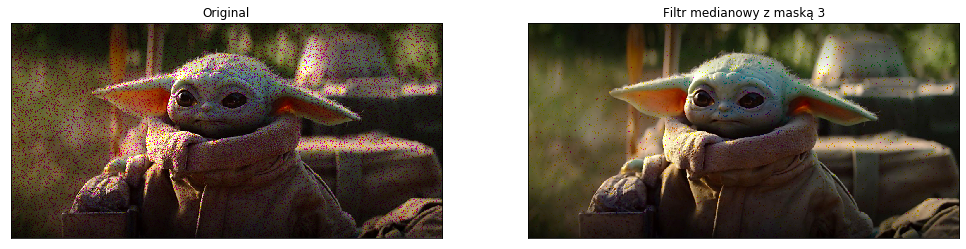

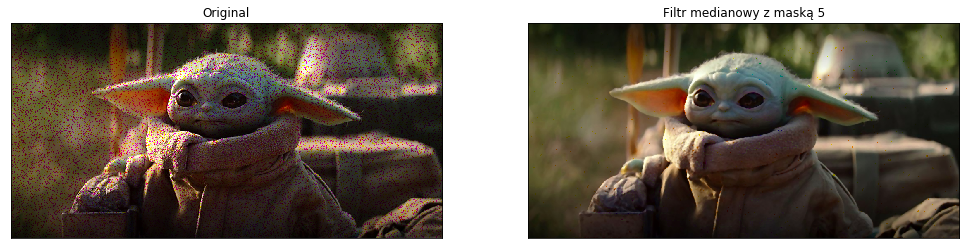

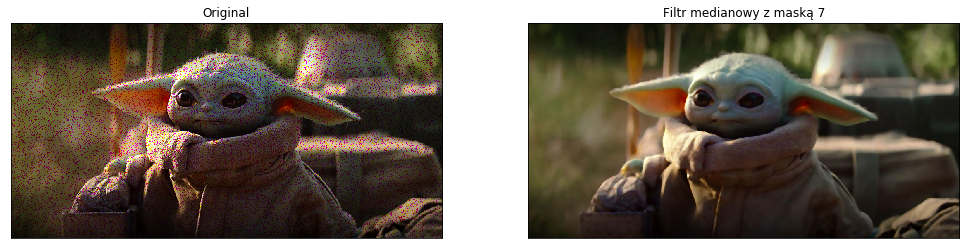

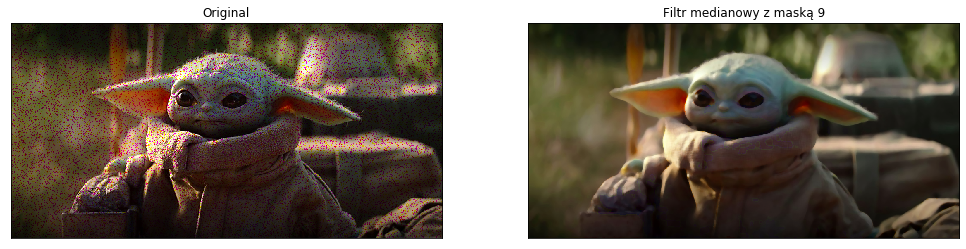

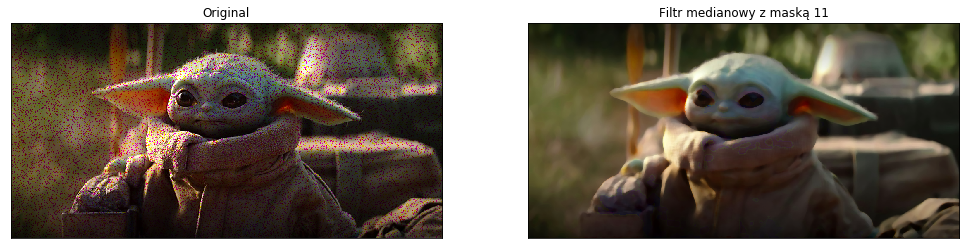

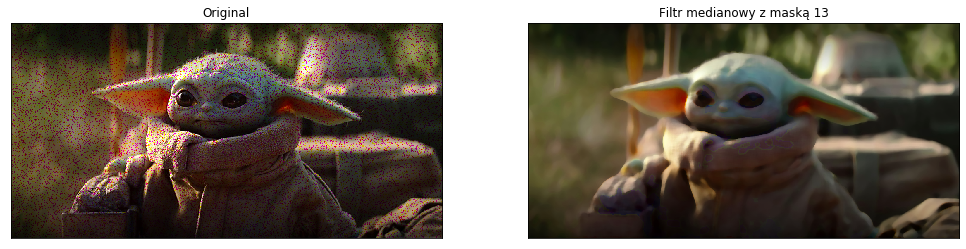

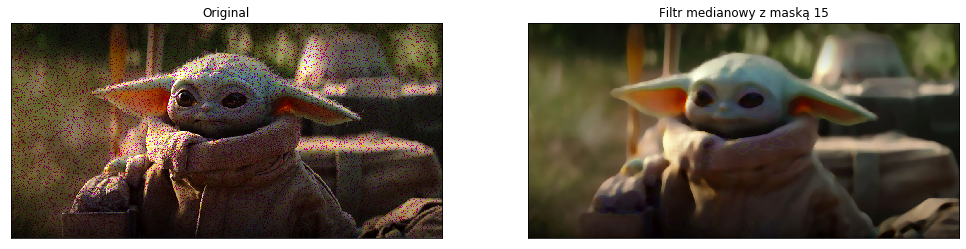

In [15]:
for i in [3,5,7,9,11,13,15]:
    new_image = cv2.medianBlur(image, i)
    plt.figure(figsize=(17,10))
    plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_HSV2RGB)),plt.title('Original')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_HSV2RGB)),plt.title(f"Filtr medianowy z maską {i}")
    plt.xticks([]), plt.yticks([])
    plt.show()

Zgodnie z naszymi przewidywaniami filtr medianowy poradził sobie o wiele lepiej z filtracją zakłóceń. Przy masce o rozmiarze *5 x 5* udało się wyeliminować szum. Duże maski podobnie jak poprzedni filtr wpływają negatywnie na jakość obrazu.